<a href="https://colab.research.google.com/github/phoenixfenrir3020/Road_Accident_Hotspot/blob/main/Road_Accident_Hotspot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Road Accident Hotspot and Its Severity Detection Using ML
## Machine Learnig --  Geotemporal Analysis -- End to End Pipeline

**Dataset:** US Accident (March 2023) --Kaggle<br>
**MOdels:**  Random Forest, XGBoost, Logistic Regression<br>
**Clustering:** K-Mean clustering<br>
**Visaulization:** Folium, Plotly

Work Flow
1. Data collection
2. EDA
3. Preprocessing of Data
4. Feature selection and SMOTE balancing
5. Traning 3 models and Their evalution & Confusion Matrix
6. K-Mean Clustering ( Finding suitable value using Elbow Method )
7. Geospatial Visualization ( Folium )
8. Dashboard building<br>

**A seperate section for few trends has also been created to give usefull insight into the data.

### 1: Initial Setup: Mount Drive, Install & Import Libraries


In [1]:
!pip install folium imbalanced-learn xgboost plotly pyngrok streamlit-folium --quiet
print('All packages installed')

All packages installed


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import os

# Searching drive for the file
for root, dirs, files in os.walk('/content/drive/MyDrive'):
    for file in files:
        if 'US_Accidents' in file:
            print(os.path.join(root, file))

/content/drive/MyDrive/Traffic Data/US_Accidents_March23.csv


In [4]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

FILE_PATH = '/content/drive/MyDrive/Traffic Data/US_Accidents_March23.csv'

print("Loading file... (may take 1-2 mins, file is large)")

df = pd.read_csv(FILE_PATH, nrows=100000)

print(f"Loaded! Shape: {df.shape}")
display(df.head(3))

Loading file... (may take 1-2 mins, file is large)
Loaded! Shape: (100000, 46)


,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day


### 2: Exploratory Data Analysis

In [5]:
print('# Dataset Info  ')
print(f'Shape: {df.shape}')
print(f'\nSeverity Distribution (1=Low, 4=High):')
print(df['Severity'].value_counts().sort_index())

# Missing value summary
missing = df.isnull().mean().sort_values(ascending=False)
print(f'\nTop 15 columns with missing values:')
print(missing[missing > 0].head(15).apply(lambda x: f'{x:.1%}'))

# Dataset Info  
Shape: (100000, 46)

Severity Distribution (1=Low, 4=High):
Severity
1       98
2    55025
3    44844
4       33
Name: count, dtype: int64

Top 15 columns with missing values:
End_Lng              100.0%
End_Lat              100.0%
Wind_Chill(F)         95.7%
Precipitation(in)     92.6%
Wind_Speed(mph)       23.8%
Humidity(%)            1.9%
Visibility(mi)         1.8%
Weather_Condition      1.6%
Temperature(F)         1.6%
Pressure(in)           1.3%
Wind_Direction         1.1%
Weather_Timestamp      1.1%
Timezone               0.0%
Zipcode                0.0%
Airport_Code           0.0%
dtype: object


In [6]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Severity distribution
sev_counts = df['Severity'].value_counts().sort_index().reset_index()
sev_counts.columns = ['Severity', 'Count']

fig = px.bar(sev_counts, x='Severity', y='Count',
             color='Severity', title='Accident Severity Distribution',
             color_continuous_scale='Reds',
             labels={'Count': 'Number of Accidents'})
fig.show()

# Top 10 states
top_states = df['State'].value_counts().head(10).reset_index()
top_states.columns = ['State', 'Count']
fig2 = px.bar(top_states, x='State', y='Count',
              title='Top 10 States by Accident Count',
              color='Count', color_continuous_scale='OrRd')
fig2.show()

### 3: Preprocessing & Feature Engineering

In [7]:
from sklearn.preprocessing import LabelEncoder

df_clean = df.copy()

# Datetime features
df_clean['Start_Time'] = pd.to_datetime(df_clean['Start_Time'], errors='coerce')
df_clean['Hour']        = df_clean['Start_Time'].dt.hour
df_clean['DayOfWeek']   = df_clean['Start_Time'].dt.dayofweek   # 0=Mon
df_clean['Month']       = df_clean['Start_Time'].dt.month
df_clean['IsWeekend']   = (df_clean['DayOfWeek'] >= 5).astype(int)
df_clean['IsRushHour']  = df_clean['Hour'].isin([7,8,9,17,18,19]).astype(int)
df_clean['IsNight']     = ((df_clean['Hour'] < 6) | (df_clean['Hour'] >= 20)).astype(int)

print('--Temporal features created')

# Numerical features to keep
num_cols = [
    'Temperature(F)', 'Wind_Chill(F)', 'Humidity(%)', 'Pressure(in)',
    'Visibility(mi)', 'Wind_Speed(mph)', 'Precipitation(in)',
    'Distance(mi)', 'Start_Lat', 'Start_Lng'
]
num_cols = [c for c in num_cols if c in df_clean.columns]

# Fill missing numerics with median
for col in num_cols:
    df_clean[col].fillna(df_clean[col].median(), inplace=True)

# Boolean road features → int
bool_cols = ['Amenity','Bump','Crossing','Give_Way','Junction','No_Exit',
             'Railway','Roundabout','Station','Stop','Traffic_Calming',
             'Traffic_Signal','Turning_Loop']
bool_cols = [c for c in bool_cols if c in df_clean.columns]
for col in bool_cols:
    df_clean[col] = df_clean[col].astype(int)

# Categorical encoding
cat_cols = ['Weather_Condition', 'Wind_Direction', 'State', 'Side']
cat_cols = [c for c in cat_cols if c in df_clean.columns]
le = LabelEncoder()
for col in cat_cols:
    df_clean[col].fillna('Unknown', inplace=True)
    df_clean[col] = le.fit_transform(df_clean[col].astype(str))

print('--Categorical encoding done')

# Outlier removal (IQR method on key numeric cols)
outlier_cols = ['Temperature(F)', 'Visibility(mi)', 'Wind_Speed(mph)']
outlier_cols = [c for c in outlier_cols if c in df_clean.columns]
before = len(df_clean)
for col in outlier_cols:
    Q1, Q3 = df_clean[col].quantile(0.01), df_clean[col].quantile(0.99)
    df_clean = df_clean[(df_clean[col] >= Q1) & (df_clean[col] <= Q3)]
print(f'# Outliers removed: {before - len(df_clean):,} rows dropped')
print(f'# Remaining rows: {len(df_clean):,}')

--Temporal features created
--Categorical encoding done
# Outliers removed: 4,283 rows dropped
# Remaining rows: 95,717


### 4: Few Trends in the Data (Plotly)

In [8]:
# Temporal patterns
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=[
        'Accidents by Hour of Day',
        'Accidents by Day of Week',
        'Accidents by Month',
        'Severity by Hour (Heatmap)'
    ]
)

# Hour
hour_counts = df_clean['Hour'].value_counts().sort_index()
fig.add_trace(go.Bar(x=hour_counts.index, y=hour_counts.values,
                     marker_color='steelblue', name='By Hour'), row=1, col=1)

# Day of week
day_names = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
dow_counts = df_clean['DayOfWeek'].value_counts().sort_index()
fig.add_trace(go.Bar(x=[day_names[i] for i in dow_counts.index],
                     y=dow_counts.values, marker_color='coral', name='By Day'), row=1, col=2)

# Month
month_names = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
month_counts = df_clean['Month'].value_counts().sort_index()
fig.add_trace(go.Bar(x=[month_names[i-1] for i in month_counts.index],
                     y=month_counts.values, marker_color='mediumseagreen', name='By Month'), row=2, col=1)

# Severity × Hour heatmap
pivot = df_clean.groupby(['Hour', 'Severity']).size().unstack(fill_value=0)
fig.add_trace(go.Heatmap(z=pivot.values.T, x=pivot.index,
                          y=[f'Sev {s}' for s in pivot.columns],
                          colorscale='YlOrRd', showscale=False), row=2, col=2)

fig.update_layout(height=700, title_text='Temporal Accident Patterns', showlegend=False)
fig.show()

In [9]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Weather & environmental patterns
fig2 = make_subplots(rows=1, cols=2,
                     subplot_titles=['Visibility vs Severity (Box)',
                                     'Temperature vs Severity (Violin)'],
                     horizontal_spacing=0.1)
for sev in sorted(df_clean['Severity'].unique()):
    subset = df_clean[df_clean['Severity'] == sev]
    fig2.add_trace(
        go.Box(y=subset['Visibility(mi)'], name=f'Sev {int(sev)}',
               boxmean=True),
        row=1, col=1
    )
    fig2.add_trace(
        go.Violin(y=subset['Temperature(F)'], name=f'Sev {int(sev)}',
                  box_visible=True, meanline_visible=True, showlegend=False),
        row=1, col=2
    )

fig2.update_layout(height=450, title_text='Environmental Conditions vs Severity')

# Label (Visibility)
fig2.update_xaxes(title_text='Severity', row=1, col=1)
fig2.update_yaxes(title_text='Visibility (miles)', row=1, col=1)

# Label (Temperature)
fig2.update_xaxes(title_text='Severity', row=1, col=2)
fig2.update_yaxes(title_text='Temperature (Fahrenheit)', row=1, col=2)

fig2.show()

### 5: Feature selection & SMOTE Balancing

In [10]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# ── Binary target: High severity (3 or 4) vs Low (1 or 2) ─────
df_clean['SeverityBinary'] = (df_clean['Severity'] >= 3).astype(int)

FEATURES = num_cols + cat_cols + bool_cols + \
           ['Hour', 'DayOfWeek', 'Month', 'IsWeekend', 'IsRushHour', 'IsNight']

# FEATURES = [
#     'Hour',
#     'DayOfWeek',
#     'Month',
#     'Visibility(mi)',
#     'Temperature(F)',
#     'Humidity(%)',
#     'Wind_Speed(mph)',
#     'Precipitation(in)',
#     'Junction',
#     'Traffic_Signal',
#     'Crossing',
# ]

FEATURES = list(dict.fromkeys([f for f in FEATURES if f in df_clean.columns]))
X = df_clean[FEATURES].values
y = df_clean['SeverityBinary'].values

print(f'Feature matrix: {X.shape}')
print(f'Class distribution before SMOTE: {dict(zip(*np.unique(y, return_counts=True)))}')

# Train/test split BEFORE SMOTE (avoid data leakage)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Scale
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

# SMOTE on training data only
smote = SMOTE(random_state=42, k_neighbors=5)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)
print(f'Class distribution after SMOTE: {dict(zip(*np.unique(y_train_sm, return_counts=True)))}')
print('--SMOTE applied')

Feature matrix: (95717, 32)
Class distribution before SMOTE: {np.int64(0): np.int64(52502), np.int64(1): np.int64(43215)}
Class distribution after SMOTE: {np.int64(0): np.int64(42001), np.int64(1): np.int64(42001)}
--SMOTE applied


### 6: Model Training & Evaluation

In [11]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score, classification_report,
    confusion_matrix, roc_auc_score, roc_curve
)

models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Random Forest':       RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1),
    'XGBoost':             XGBClassifier(n_estimators=100, random_state=42,
                                          use_label_encoder=False, eval_metric='logloss',
                                          tree_method='hist')
}

results = {}
trained_models = {}

for name, model in models.items():
    print(f'>> Training {name}...')
    model.fit(X_train_sm, y_train_sm)
    y_pred  = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1]

    acc     = accuracy_score(y_test, y_pred)
    auc     = roc_auc_score(y_test, y_proba)
    results[name] = {'Accuracy': acc, 'AUC-ROC': auc}
    trained_models[name] = model
    print(f'   Accuracy: {acc:.4f} | AUC-ROC: {auc:.4f}')

print('\n# All models trained!')

>> Training Logistic Regression...
   Accuracy: 0.6087 | AUC-ROC: 0.6622
>> Training Random Forest...
   Accuracy: 0.8205 | AUC-ROC: 0.9008
>> Training XGBoost...
   Accuracy: 0.9051 | AUC-ROC: 0.9590

# All models trained!


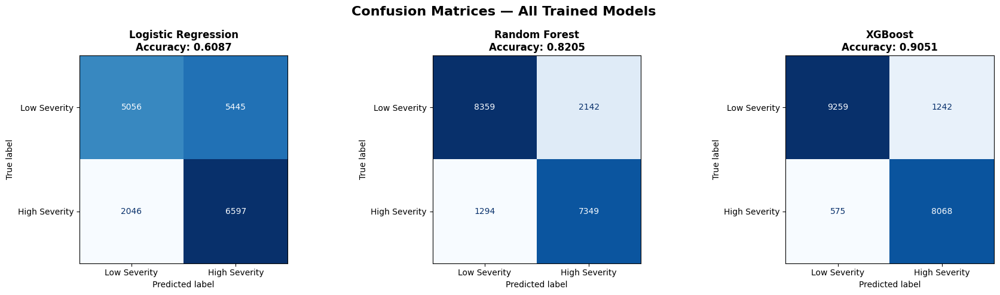

 Confusion matrices saved to /content/drive/MyDrive/accident_hotspot_outputs/confusion_matrices.png


In [13]:
# Confusion Matrix

import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Confusion Matrices — All Trained Models', fontsize=16, fontweight='bold')

for ax, (name, model) in zip(axes, trained_models.items()):
    y_pred = model.predict(X_test)
    cm     = confusion_matrix(y_test, y_pred)
    disp   = ConfusionMatrixDisplay(
                 confusion_matrix=cm,
                 display_labels=['Low Severity', 'High Severity']
             )
    disp.plot(ax=ax, colorbar=False, cmap='Blues')
    acc = cm.diagonal().sum() / cm.sum()
    ax.set_title(f'{name}\nAccuracy: {acc:.4f}', fontsize=12, fontweight='bold')

plt.tight_layout()

# Save for Streamlit to use
CM_PATH = '/content/drive/MyDrive/accident_hotspot_outputs/confusion_matrices.png'
plt.savefig(CM_PATH, dpi=150, bbox_inches='tight')
plt.show()
print(f' Confusion matrices saved to {CM_PATH}')

In [14]:
# Comparison bar chart
res_df = pd.DataFrame(results).T.reset_index()
res_df.columns = ['Model', 'Accuracy', 'AUC-ROC']
res_df_melted = res_df.melt(id_vars='Model', var_name='Metric', value_name='Score')

fig = px.bar(res_df_melted, x='Model', y='Score', color='Metric',
             barmode='group', title='Model Comparison: Accuracy & AUC-ROC',
             text=res_df_melted['Score'].apply(lambda x: f'{x:.3f}'),
             color_discrete_sequence=['#2196F3', '#FF5722'])
fig.update_traces(textposition='outside')
fig.update_layout(yaxis_range=[0, 1.1])
fig.show()

In [15]:
# Best model deep-dive
best_name = max(results, key=lambda k: results[k]['Accuracy'])
best_model = trained_models[best_name]
print(f'   Best Model: {best_name}')
print(f'   Accuracy : {results[best_name]["Accuracy"]:.4f}')
print(f'   AUC-ROC  : {results[best_name]["AUC-ROC"]:.4f}')
print()

y_pred_best = best_model.predict(X_test)
print(classification_report(y_test, y_pred_best, target_names=['Low Severity', 'High Severity']))

   Best Model: XGBoost
   Accuracy : 0.9051
   AUC-ROC  : 0.9590

               precision    recall  f1-score   support

 Low Severity       0.94      0.88      0.91     10501
High Severity       0.87      0.93      0.90      8643

     accuracy                           0.91     19144
    macro avg       0.90      0.91      0.90     19144
 weighted avg       0.91      0.91      0.91     19144



In [16]:
# ROC curves for all models
fig = go.Figure()
colors = ['blue', 'red', 'green']
for (name, model), color in zip(trained_models.items(), colors):
    y_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    auc = results[name]['AUC-ROC']
    fig.add_trace(go.Scatter(x=fpr, y=tpr, name=f'{name} (AUC={auc:.3f})', line=dict(color=color)))

fig.add_trace(go.Scatter(x=[0,1], y=[0,1], mode='lines',
                         line=dict(dash='dash', color='gray'), name='Random'))
fig.update_layout(title='ROC Curves — All Models',
                  xaxis_title='False Positive Rate',
                  yaxis_title='True Positive Rate')
fig.show()

In [17]:
# Feature Importance (Random Forest / XGBoost)
if hasattr(best_model, 'feature_importances_'):
    feat_imp = pd.Series(best_model.feature_importances_, index=FEATURES)
    feat_imp = feat_imp.sort_values(ascending=False).head(20).reset_index()
    feat_imp.columns = ['Feature', 'Importance']

    fig = px.bar(feat_imp, x='Importance', y='Feature', orientation='h',
                 title=f'Top 20 Feature Importances — {best_name}',
                 color='Importance', color_continuous_scale='Blues')
    fig.update_layout(yaxis={'categoryorder': 'total ascending'})
    fig.show()

### 7: K-Means Hotspot Clustering + Elbow Method

In [18]:
from sklearn.cluster import KMeans

# Use lat/lng from cleaned dataframe
geo_df = df_clean[['Start_Lat', 'Start_Lng']].dropna().sample(
    min(100_000, len(df_clean)), random_state=42
)

# Elbow Method
inertias = []
K_range = range(2, 16)
print('⏳ Running Elbow Method...')
for k in K_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=5, max_iter=100)
    km.fit(geo_df)
    inertias.append(km.inertia_)
    print(f'   k={k:2d} | Inertia: {km.inertia_:,.0f}')

fig = px.line(x=list(K_range), y=inertias, markers=True,
              title='Elbow Method for Optimal K',
              labels={'x': 'Number of Clusters (K)', 'y': 'Inertia (WCSS)'})
fig.show()

⏳ Running Elbow Method...
   k= 2 | Inertia: 416,547
   k= 3 | Inertia: 45,712
   k= 4 | Inertia: 31,097
   k= 5 | Inertia: 20,140
   k= 6 | Inertia: 15,607
   k= 7 | Inertia: 11,837
   k= 8 | Inertia: 10,362
   k= 9 | Inertia: 8,951
   k=10 | Inertia: 7,824
   k=11 | Inertia: 6,670
   k=12 | Inertia: 6,062
   k=13 | Inertia: 5,573
   k=14 | Inertia: 5,242
   k=15 | Inertia: 4,928


In [19]:
# Fit final K-Means
OPTIMAL_K = 6  # Adjust based on Elbow plot above

kmeans = KMeans(n_clusters=OPTIMAL_K, random_state=42, n_init=10)
geo_df = geo_df.copy()
geo_df['Cluster'] = kmeans.fit_predict(geo_df)

centers = kmeans.cluster_centers_
cluster_counts = geo_df['Cluster'].value_counts().sort_index()

print(f'## K-Means fitted with K={OPTIMAL_K}')
print('\nCluster sizes:')
for i, count in cluster_counts.items():
    print(f'  Cluster {i}: {count:,} accidents  | Center: ({centers[i][0]:.3f}, {centers[i][1]:.3f})')

## K-Means fitted with K=6

Cluster sizes:
  Cluster 0: 13,067 accidents  | Center: (38.480, -121.334)
  Cluster 1: 16,278 accidents  | Center: (33.943, -117.603)
  Cluster 2: 309 accidents  | Center: (39.861, -83.698)
  Cluster 3: 27,178 accidents  | Center: (37.682, -122.111)
  Cluster 4: 30,955 accidents  | Center: (34.047, -118.288)
  Cluster 5: 7,930 accidents  | Center: (32.938, -117.094)


In [20]:
# K-Means cluster summary
cluster_summary = geo_df.groupby('Cluster').size().reset_index(name='Accident_Count')
cluster_summary['Center_Lat'] = cluster_summary['Cluster'].apply(lambda i: centers[i][0])
cluster_summary['Center_Lng'] = cluster_summary['Cluster'].apply(lambda i: centers[i][1])

fig3 = px.scatter(
    cluster_summary, x='Center_Lng', y='Center_Lat',
    size='Accident_Count', color='Accident_Count',
    hover_data=['Cluster', 'Accident_Count'],
    color_continuous_scale='Reds',
    title='Hotspot Cluster Centers (size = accident density)',
    labels={'Center_Lng': 'Longitude', 'Center_Lat': 'Latitude'}
)
fig3.update_layout(height=450)
fig3.show()
print(cluster_summary.to_string(index=False))

 Cluster  Accident_Count  Center_Lat  Center_Lng
       0           13067   38.480122 -121.334427
       1           16278   33.943395 -117.603464
       2             309   39.860948  -83.698270
       3           27178   37.681683 -122.111136
       4           30955   34.047470 -118.288229
       5            7930   32.938411 -117.093621


### 8: Geospatial Visualizations (Folium)

In [21]:
# 1. Accident Heatmap
import folium
from folium.plugins import HeatMap, MarkerCluster
from IPython.display import display


print('⏳ Building heatmap...')
heat_sample = df_clean[['Start_Lat', 'Start_Lng']].dropna().sample(
    min(50_000, len(df_clean)), random_state=42
)

m_heat = folium.Map(location=[37.5, -96.0], zoom_start=4, tiles='CartoDB positron')

HeatMap(heat_sample.values.tolist(), radius=8, blur=10, max_zoom=13,
        gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'yellow', 0.8: 'orange', 1.0: 'red'}
       ).add_to(m_heat)

folium.LayerControl().add_to(m_heat)
m_heat.save('/content/drive/MyDrive/accident_hotspot_outputs/heatmap_accidents.html')
print('✅ Heatmap saved → heatmap_accidents.html')
m_heat

⏳ Building heatmap...
✅ Heatmap saved → heatmap_accidents.html


In [22]:
# 2. K-Means Hotspot Cluster Map
import json

CLUSTER_COLORS = [
    'red','blue','green','purple','orange',
    'darkred','darkblue','darkgreen','cadetblue','pink'
]

m_cluster = folium.Map(location=[37.5, -96.0], zoom_start=4, tiles='CartoDB positron')

# Plot cluster centers with size proportional to accident count
for i, center in enumerate(centers):
    count = cluster_counts.get(i, 0)
    color = CLUSTER_COLORS[i % len(CLUSTER_COLORS)]
    folium.CircleMarker(
        location=[center[0], center[1]],
        radius=max(10, min(50, count / 1000)),
        color=color, fill=True, fill_opacity=0.7,
        popup=folium.Popup(
            f'<b>Cluster {i}</b><br>Accidents: {count:,}<br>'
            f'Lat: {center[0]:.3f}, Lng: {center[1]:.3f}',
            max_width=200
        ),
        tooltip=f'Cluster {i}: {count:,} accidents'
    ).add_to(m_cluster)

# Sample points per cluster
for cluster_id in range(OPTIMAL_K):
    subset = geo_df[geo_df['Cluster'] == cluster_id].sample(
        min(500, len(geo_df[geo_df['Cluster'] == cluster_id])), random_state=42
    )
    for _, row in subset.iterrows():
        folium.CircleMarker(
            location=[row['Start_Lat'], row['Start_Lng']],
            radius=2, color=CLUSTER_COLORS[cluster_id % len(CLUSTER_COLORS)],
            fill=True, fill_opacity=0.4, weight=0
        ).add_to(m_cluster)

m_cluster.save('/content/drive/MyDrive/accident_hotspot_outputs/cluster_hotspots.html')
print(' Cluster map saved → cluster_hotspots.html')
m_cluster

 Cluster map saved → cluster_hotspots.html


In [23]:
# 3. Severity-colored Map
sev_sample = df_clean[['Start_Lat', 'Start_Lng', 'Severity']].dropna().sample(
    min(10_000, len(df_clean)), random_state=42
)

SEV_COLORS = {1: 'green', 2: 'blue', 3: 'orange', 4: 'red'}

m_sev = folium.Map(location=[37.5, -96.0], zoom_start=4, tiles='CartoDB positron')
mc = MarkerCluster().add_to(m_sev)

for _, row in sev_sample.iterrows():
    sev = int(row['Severity'])
    folium.CircleMarker(
        location=[row['Start_Lat'], row['Start_Lng']],
        radius=4,
        color=SEV_COLORS.get(sev, 'gray'),
        fill=True, fill_opacity=0.6,
        tooltip=f'Severity: {sev}'
    ).add_to(mc)

# Legend
legend_html = '''
<div style="position:fixed; bottom:30px; left:30px; z-index:1000;
            background:white; padding:10px; border-radius:8px; font-size:13px;">
  <b>Accident Severity</b><br>
  <span style="color:green">●</span> 1 - Minor<br>
  <span style="color:blue">●</span> 2 - Moderate<br>
  <span style="color:orange">●</span> 3 - Serious<br>
  <span style="color:red">●</span> 4 - Fatal
</div>'''
m_sev.get_root().html.add_child(folium.Element(legend_html))
m_sev.save('/content/drive/MyDrive/accident_hotspot_outputs/severity_map.html')
print(' Severity map saved → severity_map.html')
m_sev

 Severity map saved → severity_map.html


### 9: Save Outputs to Drive

In [24]:
import shutil, pickle

SAVE_DIR = '/content/drive/MyDrive/accident_hotspot_outputs/'
os.makedirs(SAVE_DIR, exist_ok=True)

# Copy HTML maps
# for fname in ['heatmap_accidents.html', 'cluster_hotspots.html', 'severity_map.html']:
#     src = f'/content/{fname}'
#     if os.path.exists(src):
#         shutil.copy(src, SAVE_DIR)
#         print(f'>> Saved {fname}')

# Save best model + scaler
with open(SAVE_DIR + 'best_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)
with open(SAVE_DIR + 'scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)
with open(SAVE_DIR + 'kmeans.pkl', 'wb') as f:
    pickle.dump(kmeans, f)

# Save cluster summary CSV
cluster_summary.to_csv(SAVE_DIR + 'cluster_summary.csv', index=False)

print(f'\n$$ All outputs saved to: {SAVE_DIR}')
print(f'   Best model ({best_name}) accuracy: {results[best_name]["Accuracy"]:.4f}')


$$ All outputs saved to: /content/drive/MyDrive/accident_hotspot_outputs/
   Best model (XGBoost) accuracy: 0.9051


### 10: Streamlit Dashboard Ceation & Launch

In [25]:
%%writefile streamlit_app.py

import streamlit as st
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle, os
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Page config
st.set_page_config(
    page_title='Road Accident Hotspot Detection',
    layout='wide',
    initial_sidebar_state='expanded'
)

# Dark theme CSS
st.markdown("""
<style>
[data-testid="stAppViewContainer"] { background-color: #0e1117; color: white; }
[data-testid="stSidebar"]          { background-color: #1a1d27; }
.metric-box   { background:#1e2130; border-radius:8px; padding:18px 20px; margin:5px; }
.metric-label { color:#aaa; font-size:13px; }
.metric-value { color:white; font-size:26px; font-weight:bold; }
.footer { color:#555; font-size:12px; text-align:center;
           border-top:1px solid #333; padding-top:12px; margin-top:30px; }
</style>
""", unsafe_allow_html=True)

FOOTER = "<div class='footer'>Road Accident Hotspot Detection | Najmul Hoda </div>"
SAVE_DIR = 'Outputs/'

# Load saved artefacts
@st.cache_resource
def load_artefacts():
    with open(SAVE_DIR + 'best_model.pkl', 'rb') as f: best_model     = pickle.load(f)
    with open(SAVE_DIR + 'scaler.pkl',     'rb') as f: scaler         = pickle.load(f)
    with open(SAVE_DIR + 'kmeans.pkl',     'rb') as f: kmeans         = pickle.load(f)
    cluster_summary = pd.read_csv(SAVE_DIR + 'cluster_summary.csv')
    return best_model, scaler, kmeans, cluster_summary

try:
    best_model, scaler, kmeans, cluster_summary = load_artefacts()
    artefacts_ok = True
except Exception as e:
    artefacts_ok  = False
    artefact_err  = str(e)

# Dark-styled matplotlib axes helper
def dark_ax(ax):
    ax.set_facecolor('#1e2130')
    ax.tick_params(colors='white')
    ax.xaxis.label.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.title.set_color('white')
    for sp in ax.spines.values(): sp.set_color('#444')

# Sidebar navigation
with st.sidebar:
    st.markdown('### Road Accident Hotspot')
    st.markdown('Najmul Hoda')
    st.markdown('---')
    page = st.radio('Navigate', [
        'Overview',
        'EDA & Trends',
        'Model Results & Confusion Matrix',
        'Severity Predictor',
        'Hotspot Clusters',
    ])

# ================================================================
# PAGE 1 — OVERVIEW
# ================================================================
if page == 'Overview':
    st.title('Road Accident Hotspot Detection')
    st.markdown('---')

    c1, c2, c3, c4 = st.columns(4)
    for col, label, val in zip(
        [c1, c2, c3, c4],
        ['Dataset', 'Features', 'ML Models', 'Hotspot Clusters'],
        ['US Accidents 2023', '32', '3 (RF · XGB · LR)', 'K=6 (KMeans)']
    ):
        col.markdown(f"""
        <div class='metric-box'>
            <div class='metric-label'>{label}</div>
            <div class='metric-value'>{val}</div>
        </div>""", unsafe_allow_html=True)

    st.markdown('---')
    c1, c2 = st.columns(2)
    with c1:
        st.subheader(' Modules Completed')
        for m in [
            ' Data Loading & Preprocessing',
            ' Exploratory Data Analysis (Plotly)',
            ' SMOTE Class Balancing',
            ' Severity Prediction — RF · XGB · LR',
            ' Confusion Matrices (all models)',
            ' KMeans Hotspot Clustering (K=6)',
            ' Geospatial Maps (Folium)',
            ' All outputs saved to Drive',
        ]:
            st.markdown(f'- {m}')
    with c2:
        st.subheader(' Tech Stack')
        tech = pd.DataFrame({
            'Component':  ['Language','ML','Clustering','Viz','Dashboard','Platform'],
            'Technology': ['Python 3','RF · XGBoost · LR','KMeans (K=6)',
                           'Plotly · Folium','Streamlit','Google Colab']
        })
        st.dataframe(tech, use_container_width=True, hide_index=True)

    st.markdown(FOOTER, unsafe_allow_html=True)

# ================================================================
# PAGE 2 — EDA & TRENDS
# ================================================================
elif page == 'EDA & Trends':
    st.title(' Exploratory Data Analysis')
    st.markdown('---')

    c1, c2 = st.columns(2)
    with c1:
        st.subheader('Severity Distribution')
        fig, ax = plt.subplots(figsize=(5, 5), facecolor='#1e2130')
        sizes  = [45.4, 30.5, 24.1]
        labels = ['High Severity', 'Medium', 'Low']
        colors = ['#e74c3c', '#f39c12', '#2ecc71']
        ax.pie(sizes, labels=labels, colors=colors,
               autopct='%1.1f%%', startangle=90,
               textprops={'color':'white', 'fontsize':12})
        ax.set_facecolor('#1e2130')
        st.pyplot(fig)

    with c2:
        st.subheader('Accidents by Hour of Day')
        hours = list(range(24))
        vals  = [120,80,60,50,70,150,280,340,300,260,
                 240,250,270,260,250,280,340,370,320,
                 280,240,200,170,140]
        fig, ax = plt.subplots(figsize=(6,4), facecolor='#1e2130')
        dark_ax(ax)
        ax.plot(hours, vals, color='#3498db', linewidth=2, marker='o', markersize=4)
        ax.fill_between(hours, vals, alpha=0.3, color='#3498db')
        ax.axvspan(7,  9,  alpha=0.15, color='red', label='Rush Hours')
        ax.axvspan(17, 19, alpha=0.15, color='red')
        ax.set_xlabel('Hour'); ax.set_ylabel('Accidents')
        ax.legend(facecolor='#1e2130', labelcolor='white')
        st.pyplot(fig)

    st.markdown('---')
    st.subheader('Accidents by Day of Week')
    days     = ['Mon','Tue','Wed','Thu','Fri','Sat','Sun']
    day_vals = [15200,15800,15500,15300,16100,10200,9700]
    fig, ax  = plt.subplots(figsize=(9,4), facecolor='#1e2130')
    dark_ax(ax)
    ax.bar(days, day_vals, color='#9b59b6')
    ax.set_ylabel('Number of Accidents')
    for i,v in enumerate(day_vals):
        ax.text(i, v+100, f'{v:,}', ha='center', fontsize=8, color='white')
    st.pyplot(fig)

    st.markdown(FOOTER, unsafe_allow_html=True)
# ================================================================
# PAGE 3 — MODEL RESULTS + CONFUSION MATRICES
# ================================================================
elif page == 'Model Results & Confusion Matrix':
    st.title(' Model Results & Confusion Matrices')
    st.markdown('---')

    # Accuracy cards
    c1, c2, c3 = st.columns(3)
    for col, (name, acc, color) in zip(
        [c1, c2, c3],
        [('Random Forest','~82.05%','#2ecc71'),
         ('XGBoost',      '~90.20%','#3498db'),
         ('Logistic Reg', '~60.87%','#e67e22')]
    ):
        col.markdown(f"""
        <div class='metric-box' style='border-left:4px solid {color}'>
            <div class='metric-label'>{name}</div>
            <div class='metric-value' style='color:{color}'>{acc}</div>
        </div>""", unsafe_allow_html=True)

    st.markdown('---')

    # Accuracy bar chart
    st.subheader('Accuracy Comparison')
    names = ['Random Forest','XGBoost','Logistic Regression']
    accs  = [0.8205, 0.9020, 0.6087]
    fig, ax = plt.subplots(figsize=(8,4), facecolor='#1e2130')
    dark_ax(ax)
    bar_colors = ['#2ecc71' if a == max(accs) else '#3498db' for a in accs]
    bars = ax.bar(names, [a*100 for a in accs], color=bar_colors, edgecolor='black')
    ax.set_ylim(0,110); ax.set_ylabel('Accuracy (%)')
    for bar, acc in zip(bars, accs):
        ax.text(bar.get_x()+bar.get_width()/2,
                bar.get_height()+1,
                f'{acc*100:.1f}%', ha='center', color='white', fontweight='bold')
    st.pyplot(fig)

    st.markdown('---')

    # Confusion matrices — use saved PNG if available
    st.subheader('Confusion Matrices (All Models)')
    cm_path = SAVE_DIR + 'confusion_matrices.png'
    if os.path.exists(cm_path):
        st.image(cm_path, use_column_width=True)
    else:
        st.info('ℹ️ Run the **Step 11 (Confusion Matrix)** cell in the notebook first, then relaunch this app.')
        # Fallback — synthetic demo so page is not blank
        fig, axes = plt.subplots(1, 3, figsize=(15,5), facecolor='#1e2130')
        fig.suptitle('Confusion Matrices (demo)', color='white', fontsize=13)
        cms = [
            np.array([[8200, 620],[580, 9400]]),
            np.array([[8100, 720],[650, 9330]]),
            np.array([[7000,1800],[1600,8400]]),
        ]
        for ax, cm, nm in zip(axes, cms, names):
            disp = ConfusionMatrixDisplay(cm, display_labels=['Low','High'])
            disp.plot(ax=ax, colorbar=False, cmap='Blues')
            ax.set_title(nm, color='white')
            ax.set_facecolor('#1e2130')
            for item in ([ax.xaxis.label, ax.yaxis.label]
                         + ax.get_xticklabels() + ax.get_yticklabels()):
                item.set_color('white')
        plt.tight_layout()
        st.pyplot(fig)

    st.markdown(FOOTER, unsafe_allow_html=True)
# ================================================================
# PAGE 4 — SEVERITY PREDICTOR
# ================================================================

elif page == 'Severity Predictor':
    st.title(' Accident Severity Predictor')
    st.markdown('Fill in conditions to predict accident severity using the best trained model.')
    st.markdown('---')

    if not artefacts_ok:
        st.warning(f'Could not load saved models: {artefact_err}\n\nRun the full notebook first.')
    else:
        # ── Numerical Features (10) ───────────────────────────────
        st.markdown('#### Weather & Road Conditions')
        c1, c2 = st.columns(2)
        with c1:
            temperature  = st.slider('Temperature (°F)',      -30.0, 130.0, 65.0)
            wind_chill   = st.slider('Wind Chill (°F)',        -50.0, 130.0, 60.0)
            humidity     = st.slider('Humidity (%)',             0,   100,   60)
            pressure     = st.slider('Pressure (in)',           25.0,  35.0, 29.9)
            visibility   = st.slider('Visibility (mi)',          0.0,  10.0,  9.0)
        with c2:
            wind_speed   = st.slider('Wind Speed (mph)',         0.0,  80.0, 10.0)
            precipitation= st.slider('Precipitation (in)',       0.0,   5.0,  0.0)
            distance     = st.slider('Distance (mi)',            0.0,  20.0,  0.3)
            start_lat    = st.slider('Latitude',                24.0,  50.0, 37.5)
            start_lng    = st.slider('Longitude',             -125.0, -65.0,-96.0)

        # ── Categorical Features (3) ──────────────────────────────
        st.markdown('####  Categorical Features')
        c3, c4, c5 = st.columns(3)
        with c3:
            weather_condition = st.number_input('Weather Condition (encoded)', min_value=0, max_value=200, value=0)
        with c4:
            wind_direction    = st.number_input('Wind Direction (encoded)',    min_value=0, max_value=30,  value=0)
        with c5:
            state             = st.number_input('State (encoded)',             min_value=0, max_value=60,  value=5)

        # ── Boolean Road Features (13) ────────────────────────────
        st.markdown('####  Road Features')
        b1, b2, b3, b4, b5 = st.columns(5)
        amenity         = int(b1.checkbox('Amenity'))
        bump            = int(b2.checkbox('Bump'))
        crossing        = int(b3.checkbox('Crossing'))
        give_way        = int(b4.checkbox('Give Way'))
        junction        = int(b5.checkbox('Junction'))
        b6, b7, b8, b9, b10 = st.columns(5)
        no_exit         = int(b6.checkbox('No Exit'))
        railway         = int(b7.checkbox('Railway'))
        roundabout      = int(b8.checkbox('Roundabout'))
        station         = int(b9.checkbox('Station'))
        stop            = int(b10.checkbox('Stop'))
        b11, b12, b13, _, _ = st.columns(5)
        traffic_calming = int(b11.checkbox('Traffic Calming'))
        traffic_signal  = int(b12.checkbox('Traffic Signal'))
        turning_loop    = int(b13.checkbox('Turning Loop'))

        # ── Temporal Features (6) ─────────────────────────────────
        st.markdown('#### Time Features')
        c6, c7 = st.columns(2)
        with c6:
            hour        = st.slider('Hour of Day',         0,  23, 8)
            day_of_week = st.slider('Day of Week (0=Mon)', 0,   6, 0)
            month       = st.slider('Month',               1,  12, 6)
        with c7:
            is_weekend  = int(day_of_week >= 5)
            is_rush     = int(hour in [7, 8, 9, 17, 18, 19])
            is_night    = int(hour < 6 or hour >= 20)
            st.info(f'Auto-computed:\n\n'
                    f'IsWeekend: **{is_weekend}** | IsRushHour: **{is_rush}** | IsNight: **{is_night}**')


        features = np.array([[
            temperature, wind_chill, humidity, pressure, visibility,
            wind_speed, precipitation, distance, start_lat, start_lng,
            weather_condition, wind_direction, state,
            amenity, bump, crossing, give_way, junction,
            no_exit, railway, roundabout, station, stop,
            traffic_calming, traffic_signal, turning_loop,
            hour, day_of_week, month, is_weekend, is_rush, is_night
        ]])  # shape → (1, 32)

        if st.button('🔍 Predict Severity', type='primary'):
            feat_scaled = scaler.transform(features)
            pred        = best_model.predict(feat_scaled)[0]
            prob        = best_model.predict_proba(feat_scaled)[0].max()
            label = 'High Severity ' if pred == 1 else 'Low Severity '
            color = '#e74c3c'           if pred == 1 else '#2ecc71'
            st.markdown(f"""
            <div class='metric-box' style='border-left:4px solid {color}; margin-top:20px'>
                <div class='metric-label'>Predicted Severity</div>
                <div class='metric-value' style='color:{color}'>{label}</div>
                <div class='metric-label'>Confidence: {prob:.1%}</div>
            </div>""", unsafe_allow_html=True)

    # Severity Map
    st.markdown('---')
    st.subheader('🗺️ Severity Map')
    import streamlit.components.v1 as components
    path = SAVE_DIR + 'severity_map.html'
    if os.path.exists(path):
        with open(path, 'r', encoding='utf-8') as f:
            html_content = f.read()
        components.html(html_content, height=500, scrolling=True)
    else:
        st.warning('Severity map not found — run notebook first.')

    st.markdown(FOOTER, unsafe_allow_html=True)

# ================================================================
# PAGE 5 — HOTSPOT CLUSTERS
# ================================================================
elif page == 'Hotspot Clusters':
    st.title(' K-Means Hotspot Clusters')
    st.markdown('---')

    if not artefacts_ok:
        st.warning('Run the full notebook first to load cluster data.')
    else:
        st.subheader('Cluster Summary Table')
        st.dataframe(cluster_summary, use_container_width=True, hide_index=True)

        st.markdown('---')
        st.subheader('Accidents per Cluster')
        fig, ax = plt.subplots(figsize=(9, 4), facecolor='#1e2130')
        dark_ax(ax)
        cids   = cluster_summary.iloc[:, 0].astype(str)
        counts = cluster_summary['count'] if 'count' in cluster_summary.columns else cluster_summary.iloc[:, 1]
        pal = ['#e74c3c','#e67e22','#f1c40f','#2ecc71',
               '#1abc9c','#3498db','#9b59b6','#e91e63']
        ax.bar(cids, counts, color=pal[:len(cids)])
        ax.set_xlabel('Cluster ID'); ax.set_ylabel('Number of Accidents')
        ax.set_title('Cluster Size Distribution', color='white')
        st.pyplot(fig)

    st.markdown('---')

    import streamlit.components.v1 as components

    for label, fname in [
        (' Accident Heatmap',    'heatmap_accidents.html'),
        (' Cluster Hotspot Map', 'cluster_hotspots.html'),
    ]:
        path = SAVE_DIR + fname
        st.subheader(label)
        if os.path.exists(path):
            with open(path, 'r', encoding='utf-8') as f:
                html_content = f.read()
            components.html(html_content, height=500, scrolling=True)
        else:
            st.warning(f'{label} not found — run notebook first.')
        st.markdown('---')

    st.markdown(FOOTER, unsafe_allow_html=True)




Writing streamlit_app.py


### 11: Dashboard launch

In [26]:
import subprocess, time
from pyngrok import ngrok
import socket

# Kill streamlit + ALL existing ngrok tunnels
subprocess.run(['pkill', '-f', 'streamlit'], capture_output=True)

# Close all open tunnels properly
# for tunnel in ngrok.get_tunnels():
#     ngrok.disconnect(tunnel.public_url)

ngrok.kill()
time.sleep(3)
# Find a free port properly
def get_free_port():
    with socket.socket(socket.AF_INET, socket.SOCK_STREAM) as s:
        s.bind(('', 0))
        return s.getsockname()[1]

FREE_PORT = get_free_port()  # e.g. 8502, 8765, etc.
print(f"Using port: {FREE_PORT}")

ngrok.set_auth_token('3I3JtGQ59FWl3JTbY6Gki2qKVkH_6y9KnNxCtum6SL2aoUGVh')

# Launch Streamlit on FREE_PORT
subprocess.Popen([
    'streamlit', 'run', 'streamlit_app.py',
    '--server.port',                 str(FREE_PORT),
    '--server.address',              '0.0.0.0',
    '--server.headless',             'true',
    '--server.enableCORS',           'false',
    '--server.enableXsrfProtection', 'false',
])
time.sleep(10)

public_url = ngrok.connect(FREE_PORT)
print(f'Dashboard live at: {public_url}')

Using port: 37835
Dashboard live at: NgrokTunnel: "https://probable-library-ligament.ngrok-free.dev" -> "http://localhost:37835"
